In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import misc
import tensorflow as tf
import time

dic_val = {'violence': 0, 'fearful': 1, 'no eye contact': 2, 'not alone': 3, 'depression': 4}

In [2]:
def getdata(folders = ['data1', 'data2']):
    images, labels = [], []
    for i in folders:
        nested_imgs, nested_labels = [], []
        list_images = os.listdir(os.getcwd() + '/' + i)
        del list_images[list_images.index('label.txt')]
        list_images = [k[:-4] for k in list_images]
        list_images.sort(key = int)
        list_images = [os.getcwd() + '/' + i + '/' + k + '.jpg' for k in list_images]
        nested_imgs += list_images
        with open(os.getcwd() + '/' + i + '/label.txt') as fopen:
            data = fopen.read().split('\n')
        data = filter(None, data)
        for k in data:
            k = k.lower()
            k = k.split(',')
            k = filter(None, k)
            k = [n.strip() for n in k]
            label = np.zeros((1, len(dic_val)), dtype = np.float32)
            for n in k:
                label[0, dic_val[n]] = 1.0
            nested_labels.append(label)
        images += nested_imgs; labels += nested_labels
    return images, labels

In [3]:
class Model:

    def __init__(self, learning_rate, beta, picture_size, label_size):

        self.X = tf.placeholder(tf.float32, (None, picture_size, picture_size, 3))
        self.Y = tf.placeholder(tf.float32, (None, label_size))

        fully_connected1 = tf.Variable(tf.random_normal([7 * 7 * 16, 512], stddev = 0.5))
        fully_b1 = tf.zeros([512])
        fully_connected2 = tf.Variable(tf.random_normal([512, 32], stddev = 0.5))
        fully_b2 = tf.zeros([32])
        fully_connected3 = tf.Variable(tf.random_normal([32, label_size], stddev = 0.5))
        fully_b3 = tf.zeros([label_size])
        
        conv1 = tf.layers.conv2d(self.X, 64, (3, 3), padding = 'same', activation = tf.nn.tanh)
        maxpool1 = tf.layers.max_pooling2d(conv1, (2, 2), (2, 2), padding = 'same')
        maxpool1 = tf.layers.batch_normalization(maxpool1)
        conv2 = tf.layers.conv2d(maxpool1, 32, (3, 3), padding = 'same', activation = tf.nn.tanh)
        maxpool2 = tf.layers.max_pooling2d(conv2, (2, 2), (2, 2), padding = 'same')
        maxpool2 = tf.layers.batch_normalization(maxpool2)
        conv3 = tf.layers.conv2d(maxpool2, 16, (3, 3), padding = 'same', activation = tf.nn.tanh)
        maxpool3 = tf.layers.max_pooling2d(conv3, (2,2), (2, 2), padding = 'same')
        maxpool3 = tf.layers.batch_normalization(maxpool3)
        conv4 = tf.layers.conv2d(maxpool3, 16, (3, 3), padding = 'same', activation = tf.nn.tanh)
        maxpool4 = tf.layers.max_pooling2d(conv4, (2, 2), (2, 2), padding = 'same')
        maxpool4 = tf.layers.batch_normalization(maxpool4)
        conv5 = tf.layers.conv2d(maxpool4, 16, (3, 3), padding = 'same', activation = tf.nn.tanh)
        maxpool5 = tf.layers.max_pooling2d(conv5, (2, 2), (2, 2), padding = 'same')
        maxpool5 = tf.reshape(maxpool5, [-1, 7 * 7 * 16])
        maxpool5 = tf.layers.batch_normalization(maxpool5)
        linear = tf.nn.tanh(tf.matmul(maxpool5, fully_connected1) + fully_b1)
        linear = tf.layers.batch_normalization(linear)
        linear = tf.nn.tanh(tf.matmul(linear, fully_connected2) + fully_b2)
        linear = tf.layers.batch_normalization(linear)
        self.logits = tf.matmul(linear, fully_connected3) + fully_b3

        self.cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels = self.Y, logits = self.logits))
        self.cost += beta * tf.nn.l2_loss(fully_connected1) + beta * tf.nn.l2_loss(fully_connected2) + beta * tf.nn.l2_loss(fully_connected3)
        self.optimizer = tf.train.AdamOptimizer(learning_rate = learning_rate).minimize(self.cost)

In [4]:
image_size = 200
learning_rate = 0.0001
beta = 0.00005
epoch = 20
batch_size = 2
images, labels = getdata()

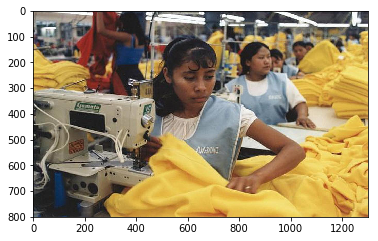

fearful: 1.0
violence: 1.0
no eye contact: 1.0
not alone: 1.0
depression: 0.0


In [5]:
image = misc.imread(images[0])
plt.imshow(image)
plt.show()
for i in xrange(labels[0].shape[1]):
    print dic_val.keys()[i] + ': ' + str(labels[0][0, i])

In [6]:
sess = tf.InteractiveSession()
model = Model(learning_rate, beta, image_size, labels[0].shape[1])
sess.run(tf.global_variables_initializer())
saver = tf.train.Saver(tf.global_variables())

In [7]:
for i in xrange(epoch):
    last = time.time()
    LOST, ACCURACY, LOSS, ACC = 0, 0, [], []
    for x in xrange(0, (len(images) // batch_size) * batch_size, batch_size):
        emb_data = np.zeros((batch_size, image_size, image_size, 3), dtype = np.float32)
        labels_data = np.zeros((batch_size, labels[0].shape[1]), dtype = np.float32)
        for k in xrange(batch_size):
            image = misc.imread(images[x + k])
            image = misc.imresize(image, (image_size, image_size)) / 255.0
            emb_data[k, :, :, :] = image
            labels_data[k, :] = labels[x + k]
        _, loss = sess.run([model.optimizer, model.cost], feed_dict = {model.X : emb_data, model.Y : labels_data})
        LOST += loss
        logits = sess.run(tf.nn.sigmoid(model.logits), feed_dict = {model.X : emb_data})
        for k in xrange(logits.shape[0]):
            ACCURACY += (logits[k, :] - labels_data[k, :]).mean()
    LOST /= (len(images) // batch_size); ACCURACY /= (len(images) // batch_size)
    print 'epoch: ' + str(i + 1) + ', loss: ' + str(LOST) + ', accuracy: ' + str(ACCURACY) + ', s / epoch: ' + str(time.time() - last)

epoch: 1, loss: 3.69357394218, accuracy: -0.248907318185, s / epoch: 4.53339195251
epoch: 2, loss: 3.39357202053, accuracy: 0.00453816911584, s / epoch: 4.07228207588
epoch: 3, loss: 3.28675102234, accuracy: -0.0265760264918, s / epoch: 4.09815406799
epoch: 4, loss: 3.2658769989, accuracy: -0.0248127050977, s / epoch: 4.13625907898
epoch: 5, loss: 3.22258340359, accuracy: -0.041846270212, s / epoch: 4.20490908623
epoch: 6, loss: 3.21746102333, accuracy: -0.0664530606288, s / epoch: 4.15525722504
epoch: 7, loss: 3.15468754292, accuracy: 0.000450627135579, s / epoch: 4.19490885735
epoch: 8, loss: 3.15247344494, accuracy: -0.0289619167824, s / epoch: 4.21652913094
epoch: 9, loss: 3.12329228878, accuracy: -0.0442537615192, s / epoch: 4.31228613853
epoch: 10, loss: 3.10448607445, accuracy: -0.0618981957342, s / epoch: 4.29140591621
epoch: 11, loss: 3.09127922058, accuracy: -0.0268478832603, s / epoch: 4.34917211533
epoch: 12, loss: 3.06233891487, accuracy: -0.0243512328685, s / epoch: 4.374

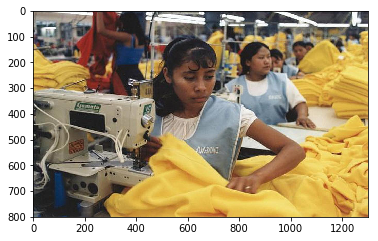

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0193326 violence: 0.628091 no eye contact: 0.783787 not alone: 0.993146 depression: 0.296599


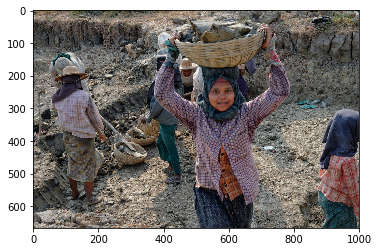

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0388164 violence: 0.953949 no eye contact: 0.825006 not alone: 0.898026 depression: 0.113504


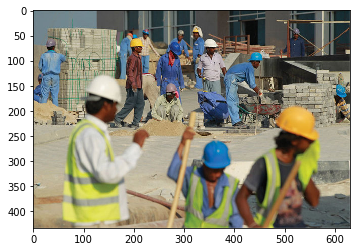

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.411092 violence: 0.908695 no eye contact: 0.831318 not alone: 0.963404 depression: 0.0392445


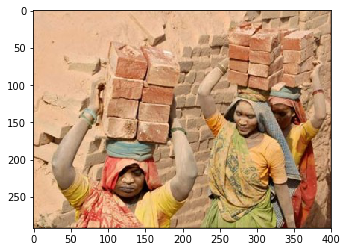

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.313986 violence: 0.918893 no eye contact: 0.874272 not alone: 0.382092 depression: 0.190021


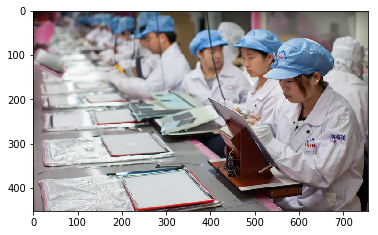

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.471934 violence: 0.928711 no eye contact: 0.811615 not alone: 0.937707 depression: 0.0338096


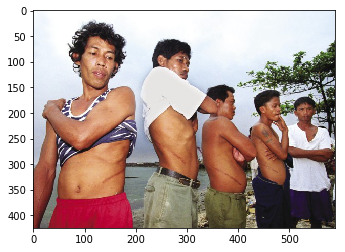

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.217772 violence: 0.506633 no eye contact: 0.646646 not alone: 0.934639 depression: 0.321067


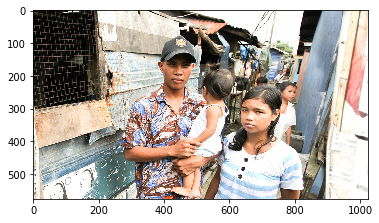

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0241665 violence: 0.646806 no eye contact: 0.615623 not alone: 0.951394 depression: 0.188247


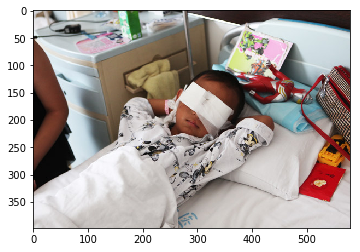

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.439977 violence: 0.867023 no eye contact: 0.672409 not alone: 0.646163 depression: 0.112535


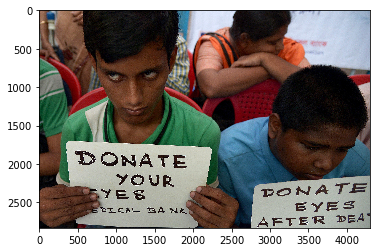

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.232983 violence: 0.817195 no eye contact: 0.692746 not alone: 0.945868 depression: 0.228492


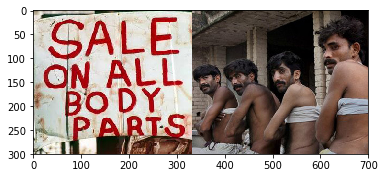

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0129782 violence: 0.670219 no eye contact: 0.636314 not alone: 0.92851 depression: 0.32125


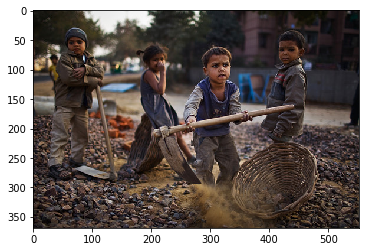

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0207941 violence: 0.653177 no eye contact: 0.673561 not alone: 0.915144 depression: 0.328447


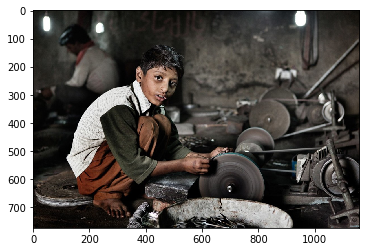

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0481039 violence: 0.684561 no eye contact: 0.744315 not alone: 0.951148 depression: 0.567739


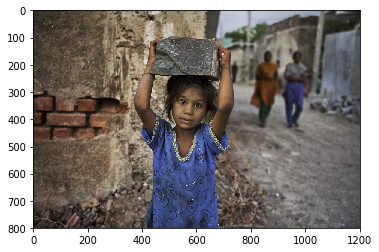

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0750485 violence: 0.737034 no eye contact: 0.774201 not alone: 0.979992 depression: 0.082099


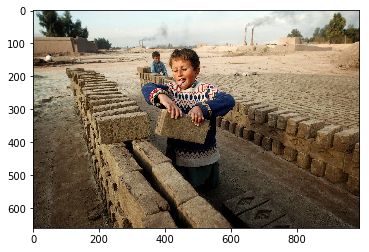

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.00899981 violence: 0.684863 no eye contact: 0.71128 not alone: 0.985195 depression: 0.361188


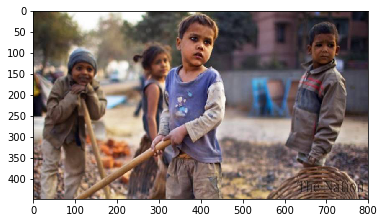

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0444684 violence: 0.860423 no eye contact: 0.346676 not alone: 0.486237 depression: 0.188291


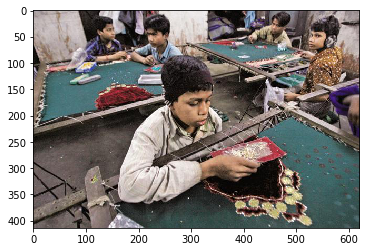

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0898222 violence: 0.918559 no eye contact: 0.776578 not alone: 0.948084 depression: 0.206398


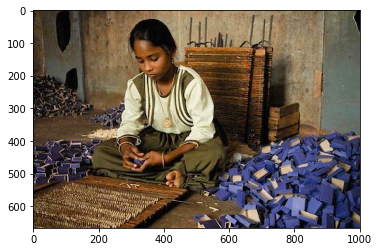

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.118054 violence: 0.636551 no eye contact: 0.695473 not alone: 0.944403 depression: 0.143177


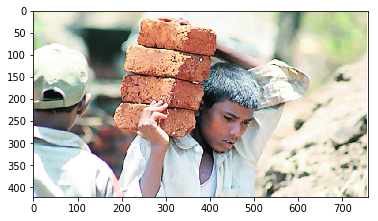

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.347032 violence: 0.635846 no eye contact: 0.740269 not alone: 0.937445 depression: 0.11709


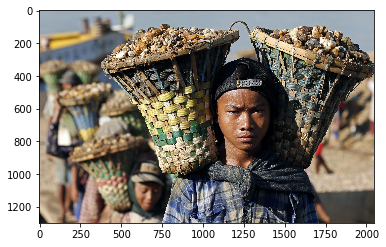

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0978698 violence: 0.856924 no eye contact: 0.782227 not alone: 0.809947 depression: 0.166372


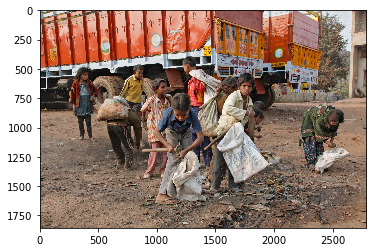

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.23927 violence: 0.587721 no eye contact: 0.768492 not alone: 0.842656 depression: 0.0951108


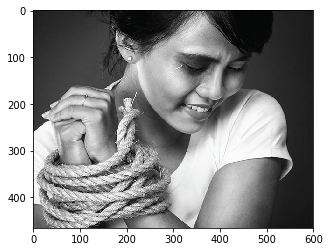

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.270748 violence: 0.811976 no eye contact: 0.809368 not alone: 0.936252 depression: 0.0657209


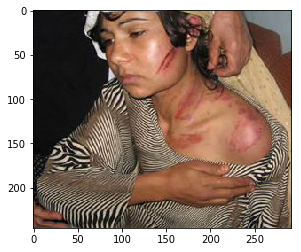

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.119616 violence: 0.727048 no eye contact: 0.719662 not alone: 0.347146 depression: 0.305652


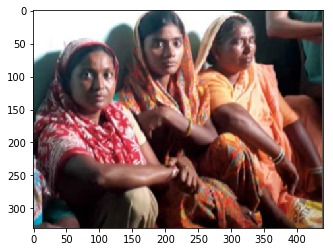

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0544337 violence: 0.729067 no eye contact: 0.775969 not alone: 0.78686 depression: 0.36851


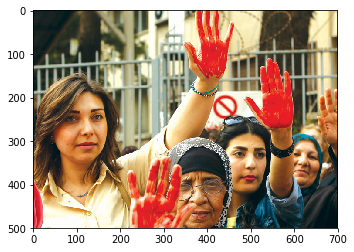

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.108857 violence: 0.825798 no eye contact: 0.752043 not alone: 0.966703 depression: 0.0799878


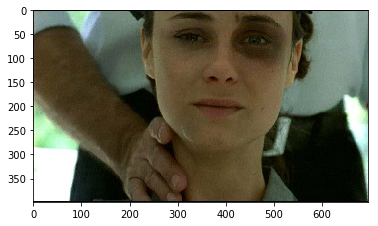

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.233756 violence: 0.7096 no eye contact: 0.880015 not alone: 0.948598 depression: 0.188873


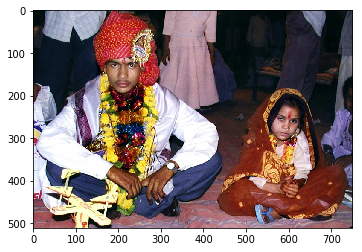

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0530958 violence: 0.55991 no eye contact: 0.576662 not alone: 0.762069 depression: 0.656995


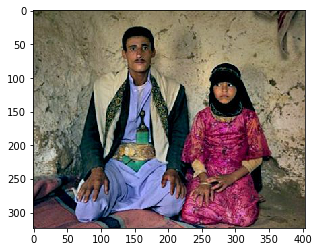

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.038464 violence: 0.873807 no eye contact: 0.651961 not alone: 0.871432 depression: 0.345945


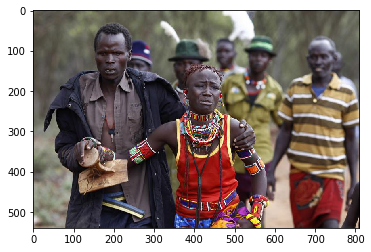

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.259147 violence: 0.888515 no eye contact: 0.840664 not alone: 0.952028 depression: 0.123375


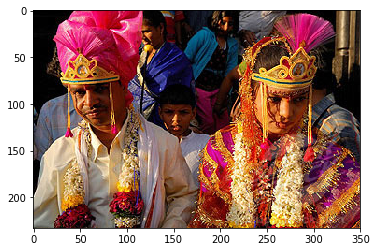

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.140798 violence: 0.626603 no eye contact: 0.872286 not alone: 0.881172 depression: 0.338461


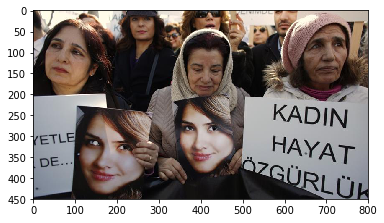

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.180501 violence: 0.776129 no eye contact: 0.779005 not alone: 0.965694 depression: 0.180772


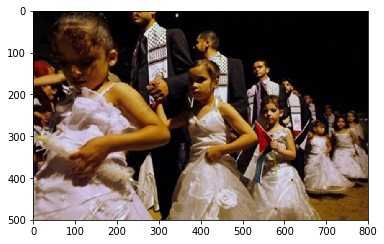

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0832014 violence: 0.725654 no eye contact: 0.653185 not alone: 0.523393 depression: 0.3762


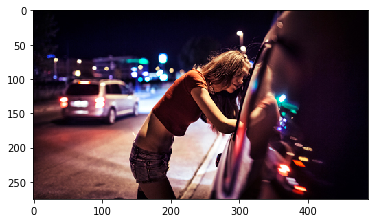

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.021733 violence: 0.695822 no eye contact: 0.840434 not alone: 0.9701 depression: 0.219656


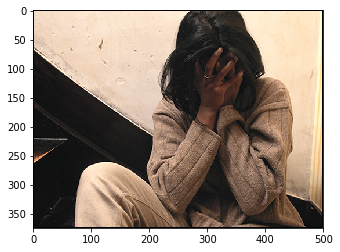

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.373777 violence: 0.909792 no eye contact: 0.833854 not alone: 0.970335 depression: 0.0389582


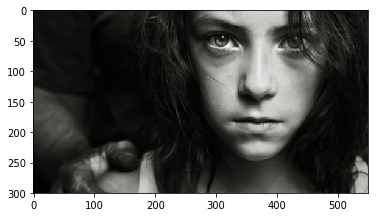

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.142245 violence: 0.857712 no eye contact: 0.760894 not alone: 0.820343 depression: 0.0476206


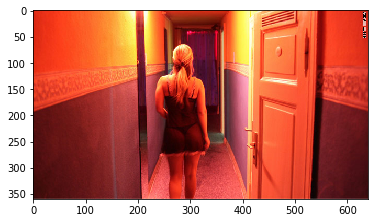

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0051693 violence: 0.708498 no eye contact: 0.537017 not alone: 0.901568 depression: 0.423769


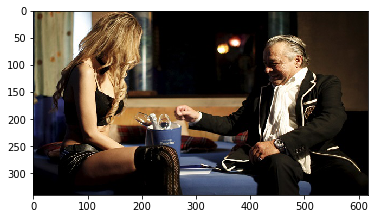

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0833758 violence: 0.637037 no eye contact: 0.682633 not alone: 0.61914 depression: 0.262367


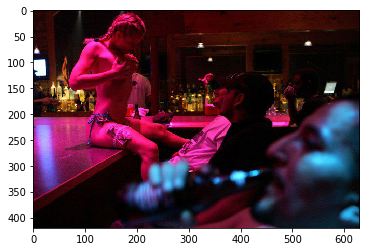

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.112337 violence: 0.816472 no eye contact: 0.888412 not alone: 0.97697 depression: 0.174686


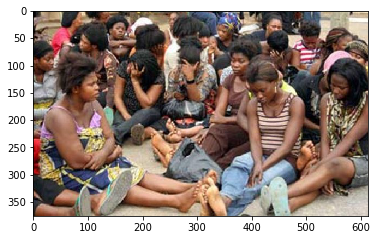

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0916584 violence: 0.860524 no eye contact: 0.804905 not alone: 0.247627 depression: 0.333256


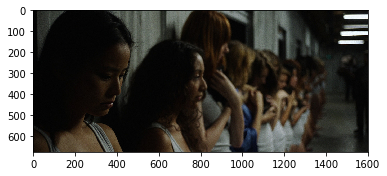

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0766007 violence: 0.845442 no eye contact: 0.701153 not alone: 0.898744 depression: 0.0863861


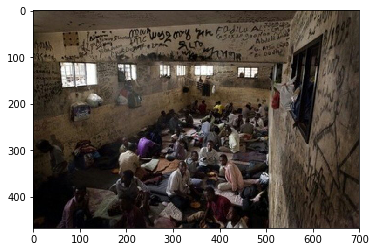

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0539576 violence: 0.8871 no eye contact: 0.700558 not alone: 0.906908 depression: 0.147152


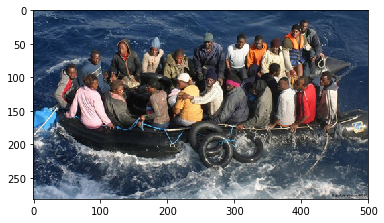

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.384969 violence: 0.863757 no eye contact: 0.591499 not alone: 0.482486 depression: 0.122091


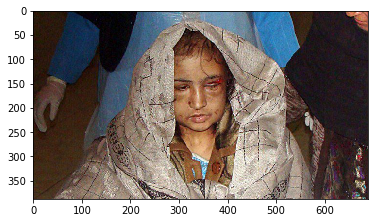

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0693755 violence: 0.900627 no eye contact: 0.457024 not alone: 0.239804 depression: 0.322736


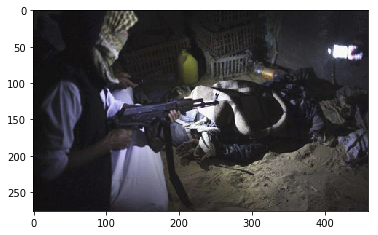

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.15493 violence: 0.861215 no eye contact: 0.757404 not alone: 0.926092 depression: 0.0844541


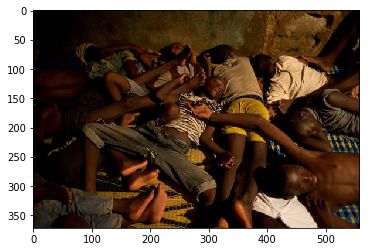

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0478295 violence: 0.578533 no eye contact: 0.537781 not alone: 0.694451 depression: 0.664463


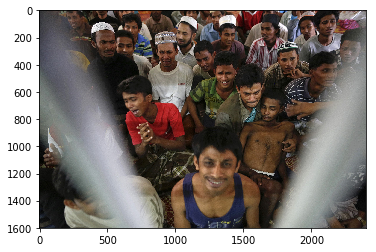

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.25486 violence: 0.560518 no eye contact: 0.681339 not alone: 0.931899 depression: 0.350039


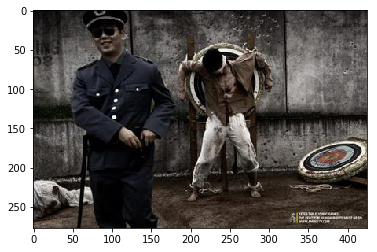

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.11528 violence: 0.721631 no eye contact: 0.467963 not alone: 0.710642 depression: 0.317944


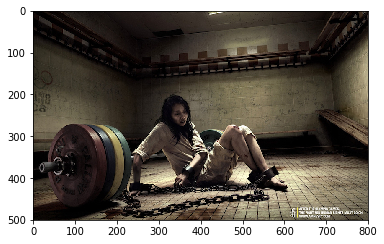

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.154037 violence: 0.827408 no eye contact: 0.860714 not alone: 0.849084 depression: 0.15451


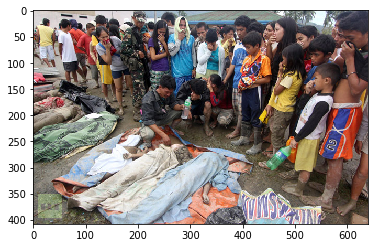

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0246391 violence: 0.566359 no eye contact: 0.778254 not alone: 0.976433 depression: 0.681342


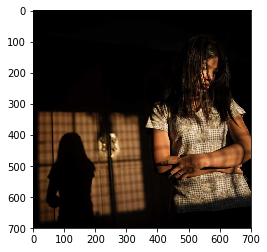

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.167124 violence: 0.650687 no eye contact: 0.879585 not alone: 0.147423 depression: 0.810599


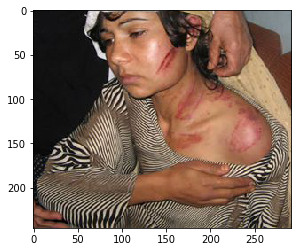

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0918137 violence: 0.81896 no eye contact: 0.748031 not alone: 0.702229 depression: 0.284645


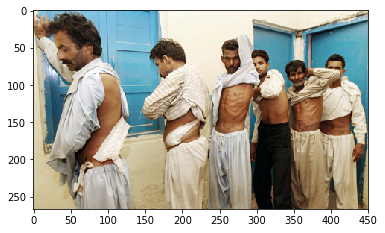

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0295176 violence: 0.973547 no eye contact: 0.765931 not alone: 0.604594 depression: 0.353887


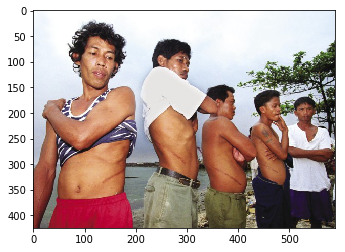

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.217772 violence: 0.506633 no eye contact: 0.646646 not alone: 0.934639 depression: 0.321067


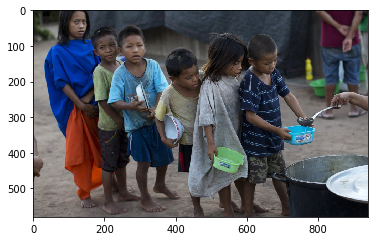

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0875373 violence: 0.883818 no eye contact: 0.878789 not alone: 0.968296 depression: 0.182305


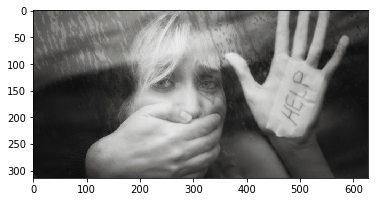

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.534193 violence: 0.920395 no eye contact: 0.820855 not alone: 0.883596 depression: 0.0312578


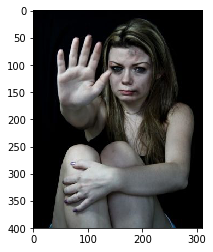

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.532874 violence: 0.976382 no eye contact: 0.872487 not alone: 0.0812198 depression: 0.455936


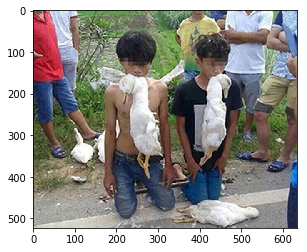

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.194597 violence: 0.744098 no eye contact: 0.788575 not alone: 0.438201 depression: 0.162032


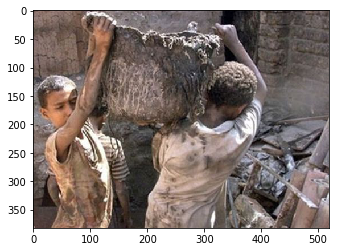

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0176533 violence: 0.712131 no eye contact: 0.804083 not alone: 0.694232 depression: 0.497408


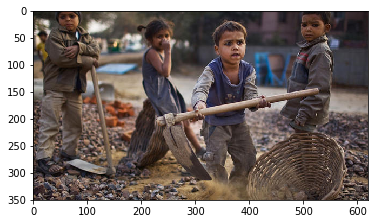

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.137439 violence: 0.759808 no eye contact: 0.770986 not alone: 0.855861 depression: 0.264324


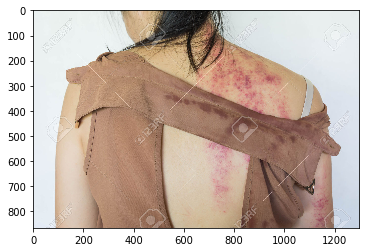

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0510976 violence: 0.532556 no eye contact: 0.758505 not alone: 0.98705 depression: 0.134689


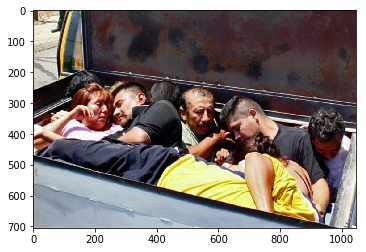

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0201132 violence: 0.508836 no eye contact: 0.762646 not alone: 0.976857 depression: 0.729653


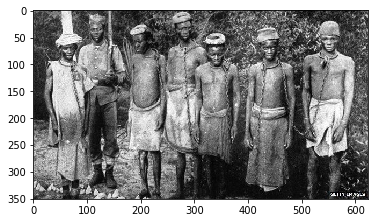

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0390416 violence: 0.904783 no eye contact: 0.724345 not alone: 0.935011 depression: 0.122965


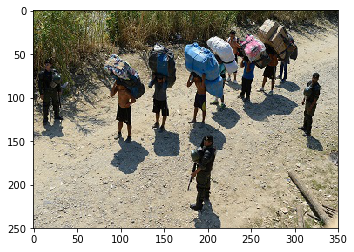

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.15898 violence: 0.947935 no eye contact: 0.888575 not alone: 0.973601 depression: 0.0840637


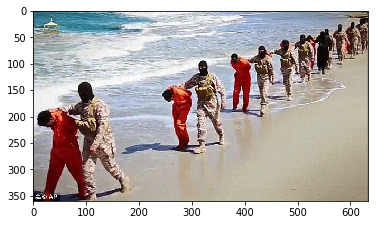

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.577332 violence: 0.947001 no eye contact: 0.863338 not alone: 0.382284 depression: 0.0422088


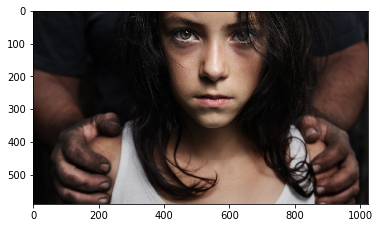

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.17405 violence: 0.734826 no eye contact: 0.668241 not alone: 0.369603 depression: 0.1077


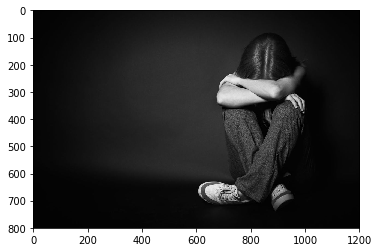

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.112614 violence: 0.884113 no eye contact: 0.794149 not alone: 0.97838 depression: 0.0471825


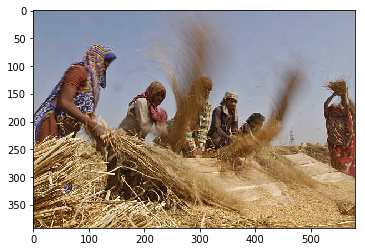

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.319157 violence: 0.485752 no eye contact: 0.618705 not alone: 0.443651 depression: 0.285681


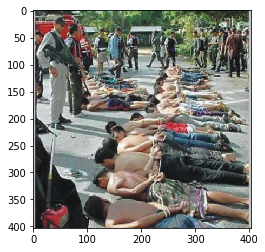

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.021811 violence: 0.858995 no eye contact: 0.783181 not alone: 0.945327 depression: 0.287664


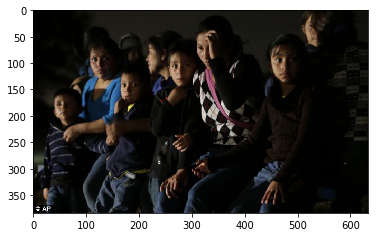

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0358719 violence: 0.839254 no eye contact: 0.892873 not alone: 0.950377 depression: 0.454165


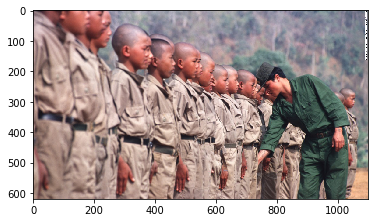

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.276689 violence: 0.524073 no eye contact: 0.64043 not alone: 0.932749 depression: 0.242297


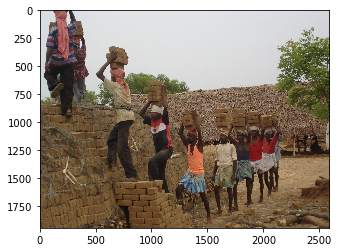

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0752673 violence: 0.694572 no eye contact: 0.823484 not alone: 0.9671 depression: 0.306301


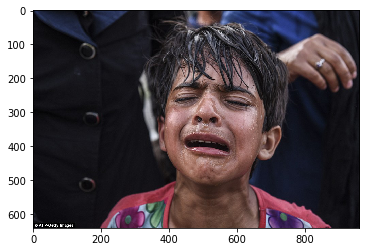

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.570035 violence: 0.86701 no eye contact: 0.789867 not alone: 0.813371 depression: 0.0601106


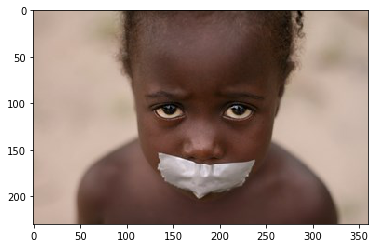

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0748288 violence: 0.823578 no eye contact: 0.793755 not alone: 0.992606 depression: 0.0642921


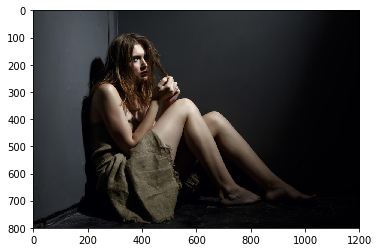

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.126351 violence: 0.737368 no eye contact: 0.676234 not alone: 0.695948 depression: 0.360593


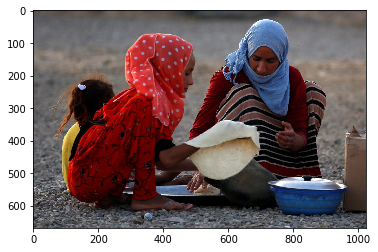

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.224191 violence: 0.925829 no eye contact: 0.650851 not alone: 0.570229 depression: 0.0732235


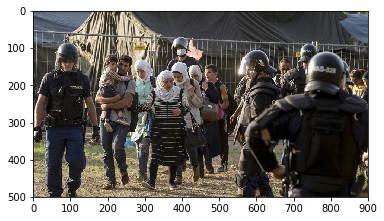

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0311128 violence: 0.84403 no eye contact: 0.745206 not alone: 0.508621 depression: 0.56704


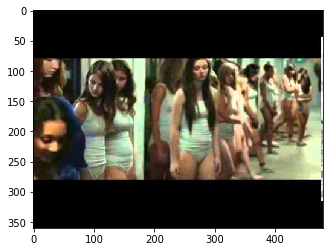

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.246166 violence: 0.713311 no eye contact: 0.519211 not alone: 0.698283 depression: 0.194441


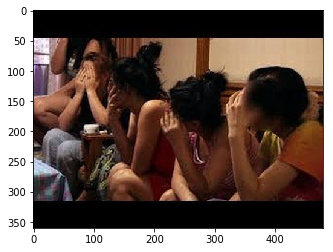

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0572581 violence: 0.919326 no eye contact: 0.826658 not alone: 0.711408 depression: 0.0695062


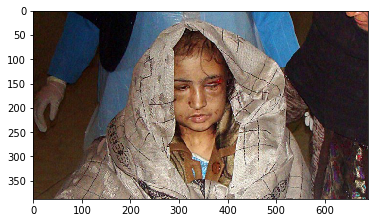

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.048667 violence: 0.868958 no eye contact: 0.486618 not alone: 0.280961 depression: 0.416243


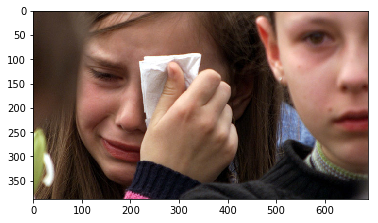

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.10443 violence: 0.50625 no eye contact: 0.854467 not alone: 0.971015 depression: 0.240543


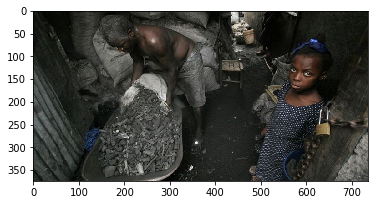

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.382963 violence: 0.912455 no eye contact: 0.795097 not alone: 0.920401 depression: 0.0433269


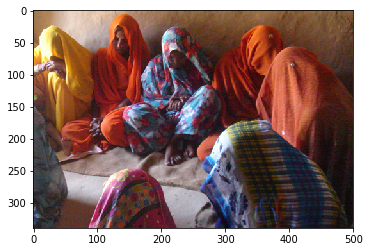

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.193489 violence: 0.664648 no eye contact: 0.799018 not alone: 0.96097 depression: 0.106103


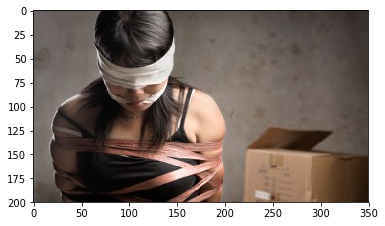

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0963802 violence: 0.83887 no eye contact: 0.743178 not alone: 0.973994 depression: 0.222736


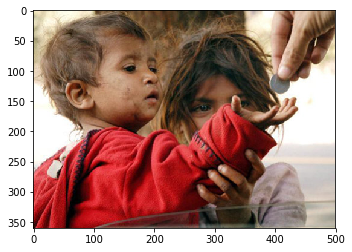

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0956055 violence: 0.810032 no eye contact: 0.83598 not alone: 0.945612 depression: 0.193599


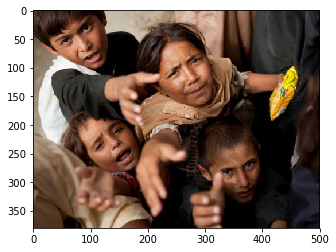

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.00198768 violence: 0.755943 no eye contact: 0.34773 not alone: 0.862953 depression: 0.770798


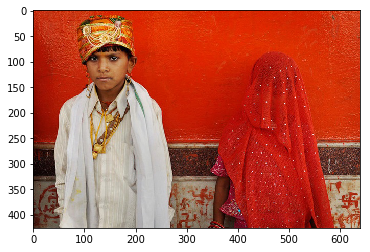

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0268245 violence: 0.945079 no eye contact: 0.934314 not alone: 0.946083 depression: 0.455306


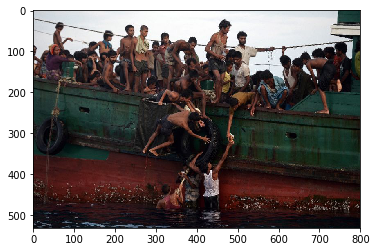

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.138628 violence: 0.752243 no eye contact: 0.857183 not alone: 0.934914 depression: 0.210626


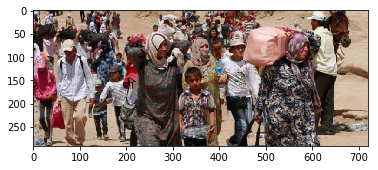

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.00938324 violence: 0.77726 no eye contact: 0.744345 not alone: 0.960944 depression: 0.330933


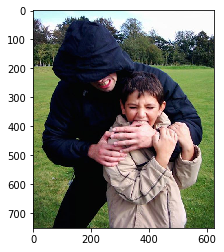

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0181607 violence: 0.876696 no eye contact: 0.826083 not alone: 0.800558 depression: 0.558841


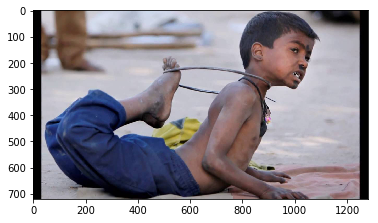

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.00685707 violence: 0.962476 no eye contact: 0.676818 not alone: 0.872671 depression: 0.30322


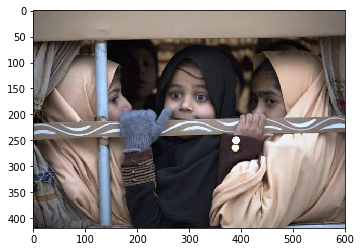

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0604643 violence: 0.8203 no eye contact: 0.790313 not alone: 0.977026 depression: 0.124457


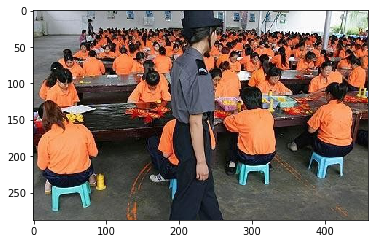

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.41005 violence: 0.897171 no eye contact: 0.77957 not alone: 0.943926 depression: 0.0497394


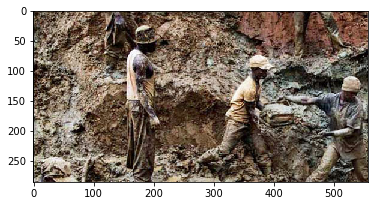

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.00870672 violence: 0.677382 no eye contact: 0.853222 not alone: 0.988416 depression: 0.438034


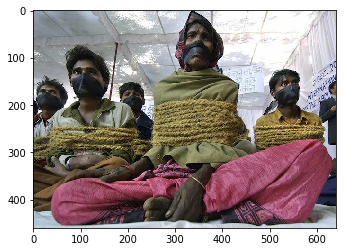

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.136554 violence: 0.799732 no eye contact: 0.670186 not alone: 0.794273 depression: 0.139226


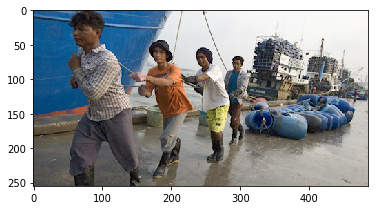

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.178555 violence: 0.92062 no eye contact: 0.444187 not alone: 0.783503 depression: 0.14844


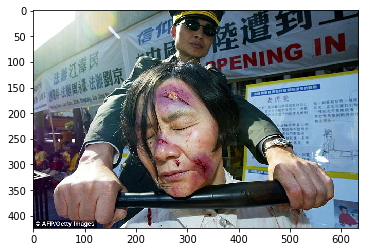

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0462565 violence: 0.714114 no eye contact: 0.753848 not alone: 0.931785 depression: 0.237869


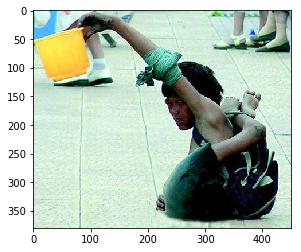

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.328532 violence: 0.721798 no eye contact: 0.668754 not alone: 0.921894 depression: 0.228663


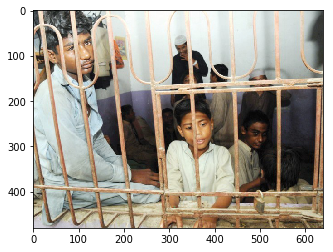

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.143428 violence: 0.828614 no eye contact: 0.861913 not alone: 0.860654 depression: 0.160028


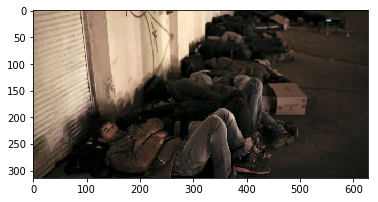

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.145225 violence: 0.955915 no eye contact: 0.930096 not alone: 0.945224 depression: 0.154387


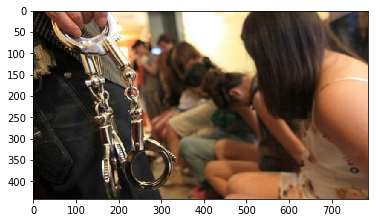

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0123312 violence: 0.696758 no eye contact: 0.839665 not alone: 0.995218 depression: 0.275688


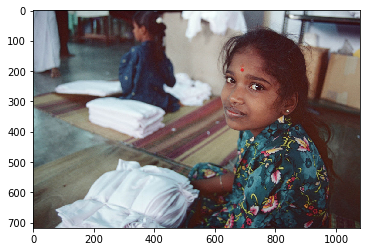

[ACTUAL]fearful: 1.0 violence: 1.0 no eye contact: 1.0 not alone: 1.0 depression: 0.0
[PREDICT]fearful: 0.0472656 violence: 0.747802 no eye contact: 0.733118 not alone: 0.953428 depression: 0.166449


In [8]:
for i in xrange(len(images)):
    emb_data = np.zeros((1, image_size, image_size, 3), dtype = np.float32)
    image = misc.imread(images[i])
    image = misc.imresize(image, (image_size, image_size))
    emb_data[0, :, :, :] = image
    logits = sess.run(tf.nn.sigmoid(model.logits), feed_dict = {model.X : emb_data})

    image = misc.imread(images[i])
    plt.imshow(image)
    plt.show()
    true = []
    for k in xrange(labels[i].shape[1]):
        true.append(dic_val.keys()[k] + ': ' + str(labels[0][0, k]))
    predict = []
    for k in xrange(labels[i].shape[1]):
        predict.append(dic_val.keys()[k] + ': ' + str(logits[0][k]))
    print '[ACTUAL]' + ' '.join(true)
    print '[PREDICT]' + ' '.join(predict)

In [9]:
emb_data = np.zeros((1, image_size, image_size, 3), dtype = np.float32)
image = misc.imread('test.jpg')
image = misc.imresize(image, (image_size, image_size))
emb_data[0, :, :, :] = image
logits = sess.run(tf.nn.sigmoid(model.logits), feed_dict = {model.X : emb_data})
predict = []
for k in xrange(labels[i].shape[1]):
    predict.append(dic_val.keys()[k] + ': ' + str(logits[0][k]))
print '[PREDICT]' + ' '.join(predict)

[PREDICT]fearful: 0.47144 violence: 0.668584 no eye contact: 0.772798 not alone: 0.534197 depression: 0.0677384
